**探索合併後的資料找課題**

## 資料視覺化
### 資源與資料載入
練習使用 plotly package 來呈現91app資料

In [2]:
import pandas as pd
import numpy as np
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import datetime
plotly.offline.init_notebook_mode()

In [3]:
UNIT_TIME = 90 # 一個購物週期3個月
UNIT_CNT = 4

In [4]:
member = pd.read_csv('NTU_1317_Member.txt', sep='\t')

c:\python27\lib\site-packages\IPython\core\interactiveshell.py:2718: DtypeWarning:

Columns (10,14) have mixed types. Specify dtype option on import or set low_memory=False.



In [5]:
main_data = pd.read_csv('Ntu_Orders.csv')

In [6]:
main_data['DateId'] = pd.to_datetime(main_data['DateId'].astype(str), format='%Y%m%d')

In [7]:
#time_start = main_data['DateId'].max() - pd.Timedelta(days=UNIT_TIME * UNIT_CNT)
#main_data = main_data[main_data['DateId'] > time_start]
main_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2268348 entries, 0 to 2268347
Data columns (total 27 columns):
SalesOrderSlaveId              int64
DateId                         datetime64[ns]
MemberId                       object
TradesOrderSlaveId             int64
ShopId                         int64
SalePageId                     int64
TradesOrderGroupCode           object
TrackSourceTypeDef             object
TrackChannelTypeDef            object
TrackDeviceTypeDef             object
LevelOneCategoryName           object
LevelTwoCategoryName           object
LevelThreeCategoryName         object
LevelFourCategoryName          object
IsMajor                        bool
IsGift                         bool
Quantity                       int64
UnitPrice                      float64
PromotionDiscount              float64
EcouponDiscount                float64
SalesOrderSlaveTotalPayment    float64
SalesOrderSlaveDateTime        object
SalesOrderSlaveStatusDef       object
PayProfile

### 依星期幾計算銷售量

In [8]:
data = main_data.groupby(by='DateId')['Quantity'].sum().to_frame()
data.reset_index(level=0, inplace=True)
data.head(5)
data['weekday'] = data['DateId'].apply(lambda x: x.weekday())
data.head()

week_data=data.groupby(by='weekday')['Quantity'].sum().to_frame()
week_data.reset_index(level=0, inplace=True)
week_data

,weekday,Quantity
0,0,316103
1,1,362231
2,2,350033
3,3,309163
4,4,293325
5,5,331869
6,6,352318


繪圖呈現 最高與最低值以不同顏色標出

In [9]:
wd=go.Bar(x=['日','一','二','三','四','五','六'],y=week_data['Quantity'],width=0.5,marker=dict(color=[1,2,1,1,3,1,1]))
layout=go.Layout(title='星期幾 v.s 銷售量',yaxis=dict(title='銷售量'))
plotly.offline.iplot(go.Figure(data=[wd],layout=layout))

### 顧客分群視覺化呈現
統計單次購物車消費金額

In [10]:
main_by_basket = main_data.groupby(by=['TradesOrderGroupCode','MemberId'], as_index=False)['SalesOrderSlaveTotalPayment'].sum()


計算每位會員平均單次消費額及資料合併

In [11]:
def rename_col_to(name):
    if name == 'SalesOrderSlaveTotalPayment':
        return 'RecentAveragePurchase'
    else:
        return name
    
member_avg = pd.DataFrame()
member_avg = main_by_basket.groupby(by='MemberId', as_index=False).agg('mean')
member_avg = member_avg.rename(columns = rename_col_to)
member_avg.head()

,MemberId,RecentAveragePurchase
0,00002962-4E01-4D5B-A23C-AF05A965212E,2963.0
1,000037B9-82D7-4F41-A748-FD64AF00A535,1196.0
2,00004BE7-17B5-4DA8-A31D-673BCD22F018,316.0
3,00008557-6564-46EB-8B00-70D3DEE91FF0,679.0
4,000248F1-4864-40B7-A987-E27884C0971C,597.0


In [12]:
member_cnt = main_by_basket.groupby(by='MemberId', as_index=False).agg('count')
member_avg['RecentCount'] = member_cnt['TradesOrderGroupCode']
member_avg['RecentTotal'] = member_avg['RecentCount'] * member_avg['RecentAveragePurchase']

member_new = pd.merge(member, member_avg, on='MemberId')
member_new=member_new[member_new['RecentCount']<100]
member_new=member_new[member_new['RecentTotal']<70000]

要了解並觀察所用指標(購物數 均價)的特性 而採視覺化呈現
購物次數 v.s 購物均價

In [13]:

layout=go.Layout(title='購物次數 v.s 購物均價',yaxis=dict(title='均價'))


trace = go.Scattergl(
    x = member_new['RecentCount'],
    y = member_new['RecentAveragePurchase'],
    mode = 'markers',
    marker = dict(
        color = '#FFBAD2',
        line = dict(width = 1)
    )
)

plotly.offline.iplot(go.Figure(data=[trace], layout=layout))

購物次數與購物總額 很自然地呈現正相關

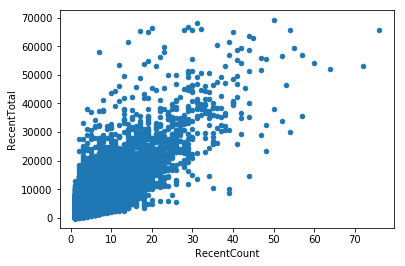

In [14]:
member_new.plot.scatter(x='RecentCount', y='RecentTotal')
plt.show()

購物次數的人數分布 以hist圖和折線圖呈現

(0, 10)

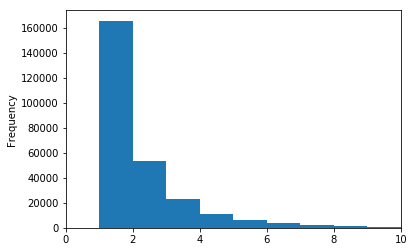

In [15]:
member_new['RecentCount'].plot.hist(bins=75)
plt.xlim((0,10))

(0, 10)

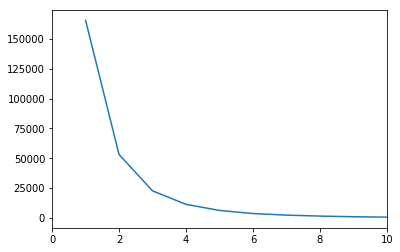

In [16]:
buy_counts = member_new['RecentCount'].value_counts()
buy_counts.plot()
plt.xlim((0,10))

In [17]:
member_new['RecentAveragePurchase'].mean()

993.30801860163456

In [18]:
highpay=member_new[member_new['RecentAveragePurchase']>993]
lowpay=member_new[member_new['RecentAveragePurchase']<=993]

In [19]:
print (highpay[highpay['RecentCount']>1]['RecentCount'].mean(),highpay[highpay['RecentCount']>1]['RecentCount'].std())


(3.5567305381371672, 2.9532383265332047)


In [20]:
print(lowpay[lowpay['RecentCount']>1]['RecentCount'].mean(), lowpay[lowpay['RecentCount']>1]['RecentCount'].std())

(3.2454987670168562, 2.5327336800286941)


各購物次數的顧客平均消費

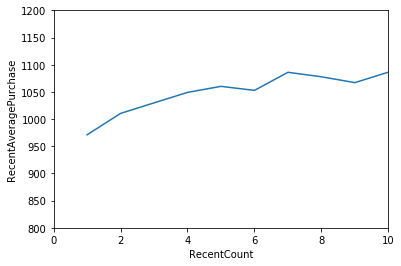

In [21]:
member_new.groupby(by='RecentCount')['RecentAveragePurchase'].mean().plot()
plt.xlim((0,10))
plt.ylim((800,1200))
plt.ylabel('RecentAveragePurchase')

各購物次數的顧客消費總額

(0, 10)

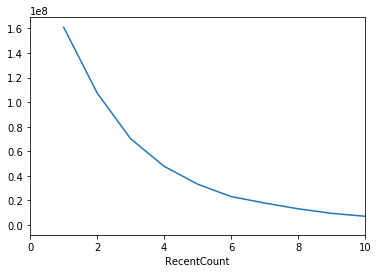

In [22]:
member_new.groupby(by='RecentCount')['RecentTotal'].sum().plot()
plt.xlim((0,10))

各消費均價的顧客人數分布

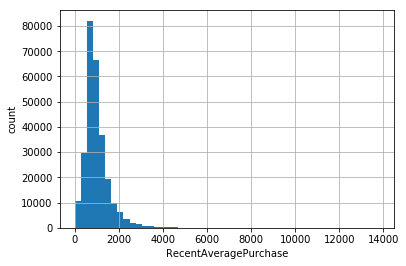

In [23]:
member_new['RecentAveragePurchase'].hist(bins=50)
plt.xlabel('RecentAveragePurchase')
plt.ylabel('count')

將顧客以消費均價及次數劃分後
人數圓餅圖

In [24]:
hh=len(member_new[(member_new['RecentAveragePurchase']>993) & (member_new['RecentCount']>1) ])
lh=len(member_new[(member_new['RecentAveragePurchase']<993) & (member_new['RecentCount']>1) ])
hl=len(member_new[(member_new['RecentAveragePurchase']>993) & (member_new['RecentCount']==1) ])
ll=len(member_new[(member_new['RecentAveragePurchase']<993) & (member_new['RecentCount']==1) ])

labels = ['高均價高次數','低均價高次數','高均價低次數','低均價低次數']
values = [hh,lh,hl,ll]

trace = go.Pie(labels=labels, values=values)

plotly.offline.iplot([trace], filename='basic_pie_chart')

In [25]:
lh


59174